## In this notebook we will be comparing different color spaces and their effects on histogram equalization. We will be using the images provided in the course. For each color space we selected one channel, applied equalization and replaced equalized channel with the original one. We will be using the same function for all color spaces, so we will be able to compare the results.

In [1]:
import cv2
import numpy as np
import matplotlib
import os

from math import ceil
from matplotlib import pyplot as plt

from utils import show_histogram, equalize_comparision

matplotlib.rcParams['figure.figsize'] = (13, 8)

In [2]:
NUCLEI_PATH = 'Data Povid 2 cviko/Histology nuclei/'
nuclei_files = os.listdir(NUCLEI_PATH)
nuclei_files

['TCGA-18-5592-01Z-00-DX1.tif',
 'TCGA-21-5784-01Z-00-DX1.tif',
 'TCGA-21-5786-01Z-00-DX1.tif',
 'TCGA-38-6178-01Z-00-DX1.tif',
 'TCGA-49-4488-01Z-00-DX1.tif',
 'TCGA-50-5931-01Z-00-DX1.tif']

In [3]:
nuclei_images = [cv2.imread(NUCLEI_PATH + file) for file in nuclei_files]

For the first color space we will be using BGR (RGB). As we can see from the results, the best tactic would be equalizing red channel to gain the best results. The equalization of green channel is not bad, but it is not as good as the red one. The equalization of blue channel is not good at all, because the blue channel is not very informative in this case.

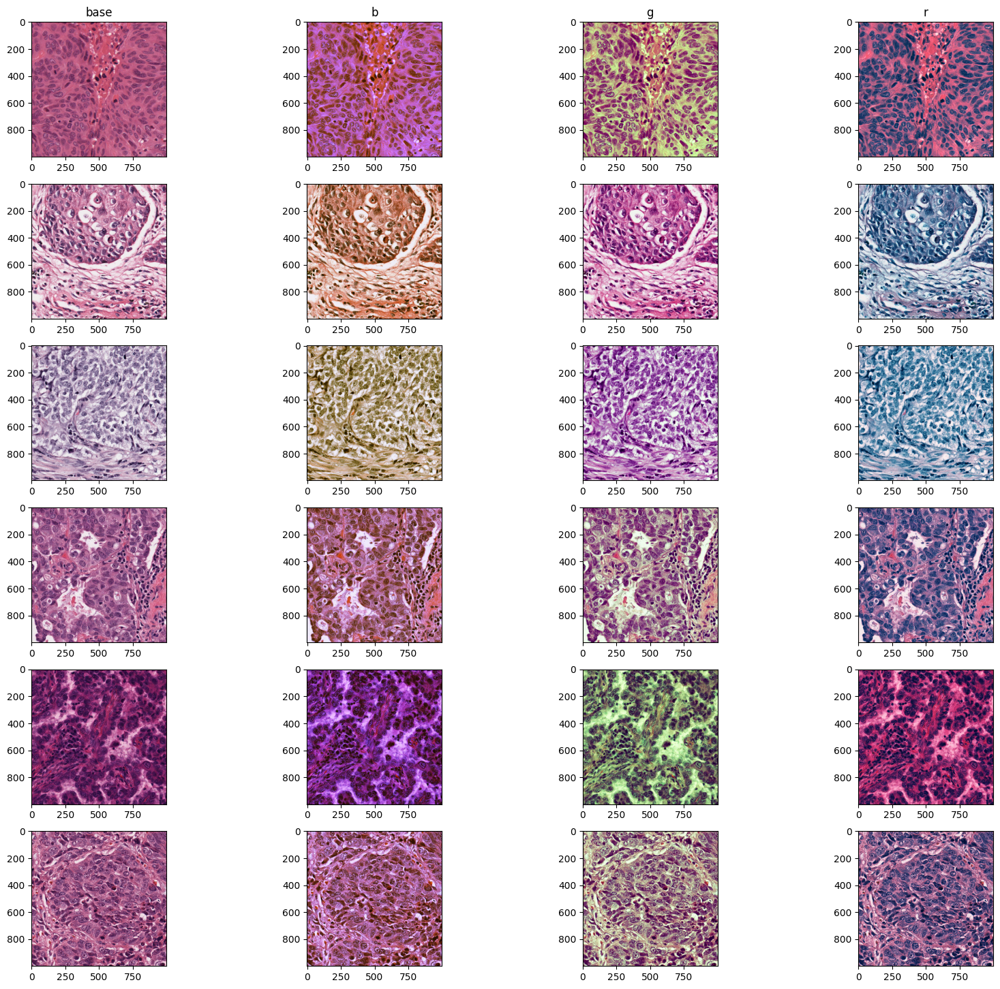

In [4]:
bgr_nuclei = nuclei_images.copy()
equalize_comparision(bgr_nuclei, ["b", "g", "r"], cv2.COLOR_BGR2RGB)

HSV color space provided better results (better contrst images) for channel V (value) as previous tests (RGB-R). The equalization of channel H (hue) provided us with almost worse results than the original image. The equalization of channel S (saturation) provided us with similar results as the equalization of channel H.

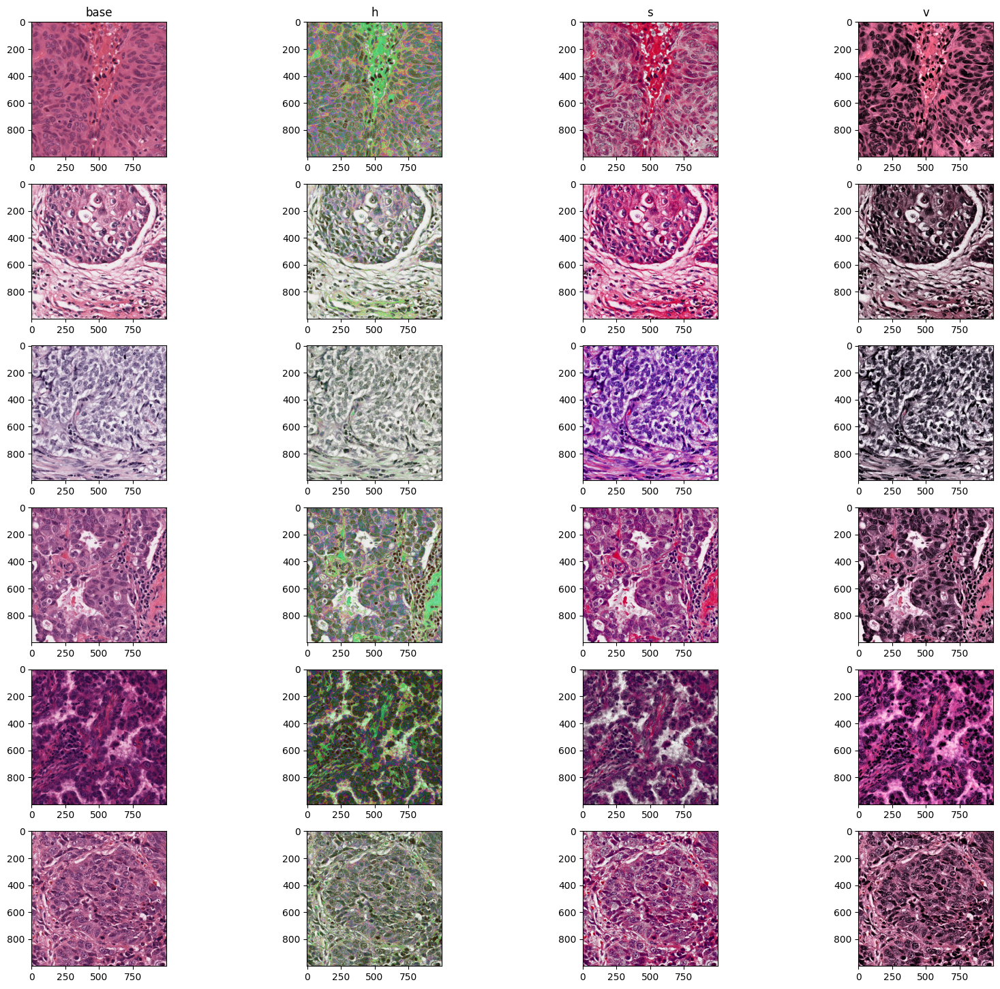

In [5]:
nuclei_copy = nuclei_images.copy()
hsv_nucleis = [cv2.cvtColor(image, cv2.COLOR_BGR2HSV) for image in nuclei_copy]
equalize_comparision(hsv_nucleis, ["h", "s", "v"], cv2.COLOR_HSV2RGB)

Color space LAB provided us with the best results so far. The contrast is superior across equalizations of each channels. The problem could be equalization of A channels when the cells could merge together, as we can see the most of that effect on the penultimate image. So i would say that the best tactic would be equalizing L or B channel.

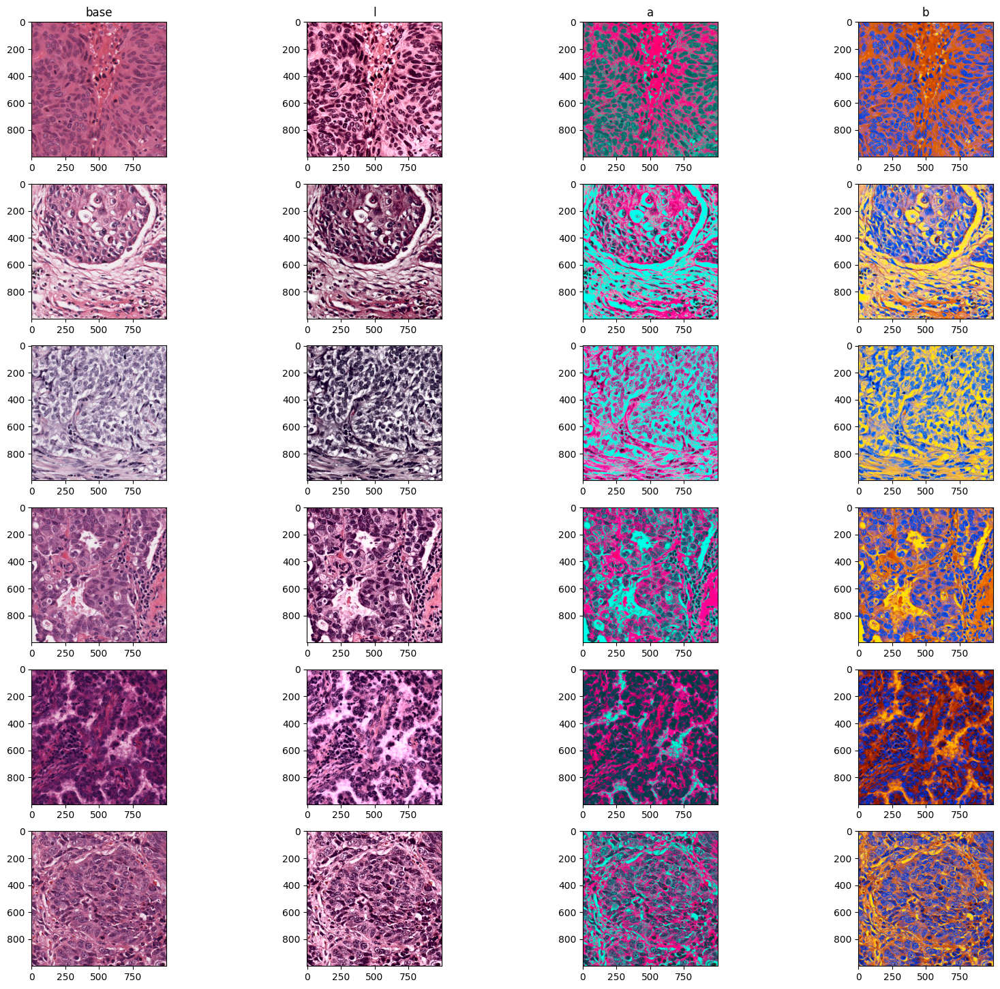

In [6]:
nuclei_copy = nuclei_images.copy()
lab_nucleis = [cv2.cvtColor(image, cv2.COLOR_BGR2Lab) for image in nuclei_copy]
equalize_comparision(lab_nucleis, ["l", "a", "b"], cv2.COLOR_Lab2RGB)

Color space YCrCb provided us with similar results as the LAB color space. In this case the channel Cb suffers the problem of merging cells which we can mostly see on penultimate image.

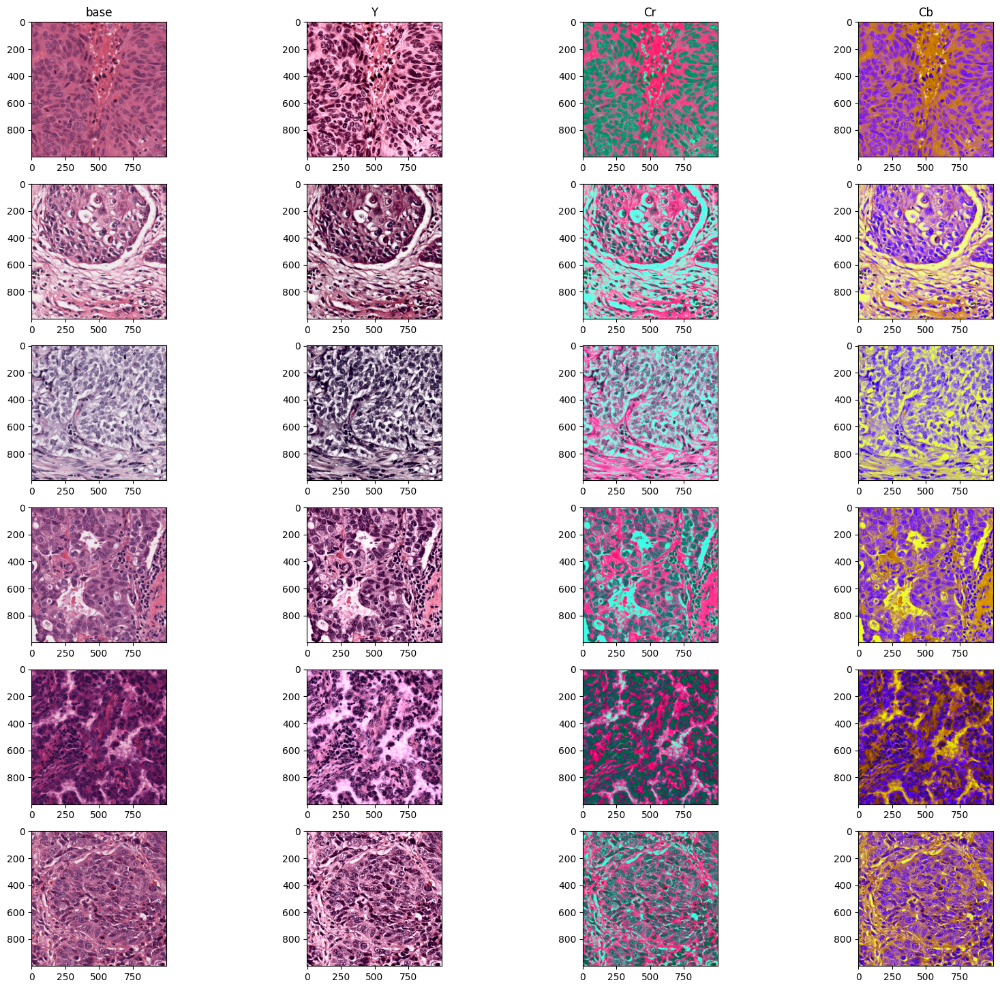

In [7]:
nuclei_copy = nuclei_images.copy()
ycrcb_nucleis = [cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb) for image in nuclei_copy]
equalize_comparision(ycrcb_nucleis, ["Y", "Cr", "Cb"], cv2.COLOR_YCrCb2RGB)

Finally color space XYZ. The equalizations of channel Z looks similar to RGB-R so dont recommend using it. The equalization of channel X and Y looks on the contrast level similar to each other with same disadvantages on some images. This color model looks like not very good for this task as the results can differ from image to image. The worst performance can be seen on 2. and 3. image.

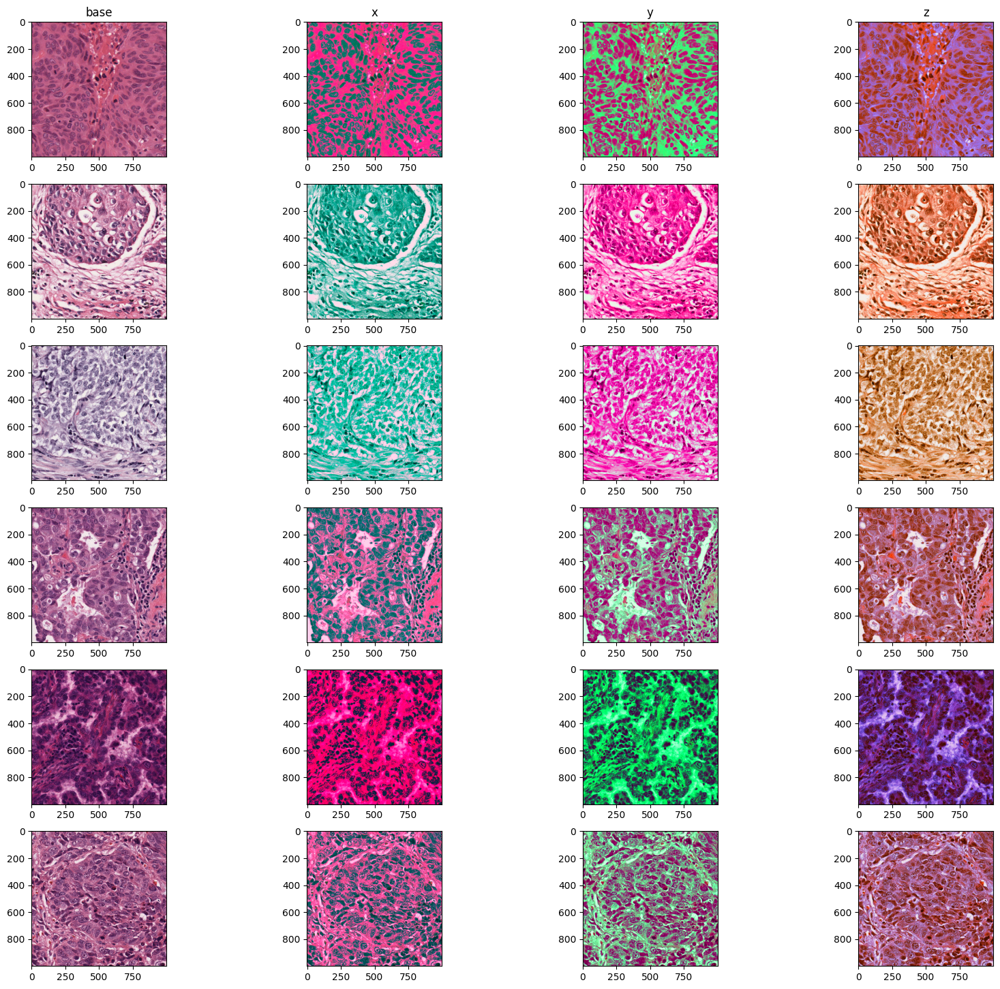

In [8]:
nuclei_copy = nuclei_images.copy()
xyz_nucleis = [cv2.cvtColor(image, cv2.COLOR_BGR2XYZ) for image in nuclei_copy]
equalize_comparision(xyz_nucleis, ["x", "y", "z"], cv2.COLOR_XYZ2RGB)